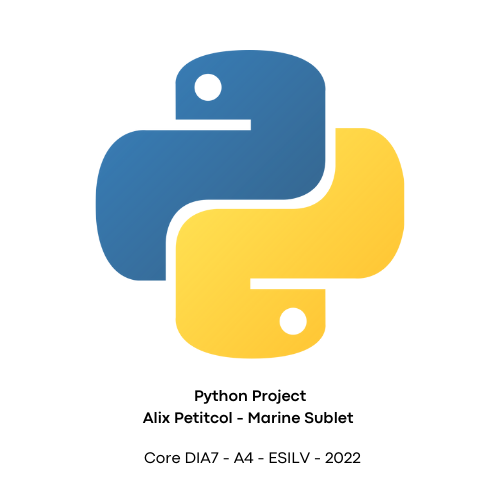

# Facebook Python Project

*Welcome on this notebook, dedicated to our [python project](PythonProject.pptx).*



***Reminder of the project :*** 
*From a set of data, carry out a complete study with visualization and machine learning algorithms in order to explain the different links existing between the variables of the dataset.* 


*Perform your visualization study on a Jupyter notebook and offer a Flask API to visualize and create one of the best prediction models you will find, where a user can choose the parameters suitable for the model.*



***Note I :*** *The main purpose here is to estimate the number of comments that a Facebook message should receive in the hours following its post. The number of comment is modelized by the column "Target Variable" in the datasets. The analysis will be done first by studying through different graphs user behavior and the trends that stand out the most. Secondly, you will find the  Machine Learning part where we perform an ACP and then we implement some prediction algorithms using regression techniques.*




***Note II :*** *[For the Prediction part] The Flask API is enable on the same directory and can be run when using the python command : python MyFlaskApp.py in your terminal.*


### Table of Contents

* [Libraries Imports and Installation](#IMPORT_INSTALLATION)
    * [Import Libraries](#Libraries)
    * [Import the datasets](#Dataset)
    * [Prepare the datasets](#prepare1)
* [Visualization Study](#VISUALIZATION)
    * [1. General Study of the dataset composition](#General_Study)
    * [2. Study of several feature's impact on target variable](#Focus_Studies) 
        * [2.1 : Focus Study on Page Category](#Page_Category)
        * [2.2 : Weekday impact](#Weekday)
        * [2.3 : Influence of Length](#Length)
        * [2.4 : Other features' influences](#Other)
* [Machine Learning](#Machine_learning)
    * [1. Principal component analysis](#PCA)
        * [Import Libraries](#Libraries2)
        * [Data Preparation](#prepare2)
        * [PCA](#pca)
    * [2. Predictions](#predictions)
        * [Data Preparation](#prepare3)    
        * [SVM](#svm)
        * [Lasso](#lasso)
        * [Ridge](#ridge)
        * [ElasticNetCV](#elasticNetCV)
        * [RandomForestRegressor](#random_forest_regressor)
        * [GradientBoostingRegressor](#gradient_boosting_regressor)
        * [VotingClassifier](#voting_classifier)
        * [Graphics](#graph)



### Libraries Imports and Installation <a class="anchor" id="IMPORT_INSTALLATION"></a>

#### Import Libraries <a class="anchor" id="Libraries"></a>

In [1]:
#!pip install plotly 
#!pip install pygal
#!pip install wordcloud


import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pygal

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
from collections import Counter

# interactive visualization
import plotly.express as px

#### Import the datasets <a class="anchor" id="Dataset"></a>

In [2]:
datafb1 = pd.read_csv("C:/Users/alixp/OneDrive/Bureau/ESILV/A4/Python/Features_Variant_1.csv",index_col = None,header = None)
datafb2 = pd.read_csv("C:/Users/alixp/OneDrive/Bureau/ESILV/A4/Python/Features_Variant_2.csv",index_col = None,header = None)
datafb3 = pd.read_csv("C:/Users/alixp/OneDrive/Bureau/ESILV/A4/Python/Features_Variant_3.csv",index_col = None,header = None)

#### Prepare the datasets <a class="anchor" id="prepare1"></a>

1) Fast inspection of the dataset :

In [4]:
datafb1.head(5)

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,53
0,634995,0,463,1,0.0,806.0,11.291045,1.0,70.495138,0.0,...,0,0,0,0,0,0,0,0,1,0
1,634995,0,463,1,0.0,806.0,11.291045,1.0,70.495138,0.0,...,0,0,0,0,0,0,0,1,0,0
2,634995,0,463,1,0.0,806.0,11.291045,1.0,70.495138,0.0,...,1,0,0,0,0,0,0,0,1,0
3,634995,0,463,1,0.0,806.0,11.291045,1.0,70.495138,0.0,...,1,0,0,1,0,0,0,0,0,0
4,634995,0,463,1,0.0,806.0,11.291045,1.0,70.495138,0.0,...,0,0,0,0,0,1,0,0,0,0


2) Rename the columns of all the dataset as explained in the [given document](https://archive.ics.uci.edu/ml/datasets/Facebook+Comment+Volume+Dataset)

In [3]:
column_names= ["Page Popularity/likes","Page Checkings","Page talking about","Page Category",
"Derived_5","Derived_6","Derived_7","Derived_8","Derived_9","Derived_10","Derived_11","Derived_12","Derived_13","Derived_14",
"Derived_15","Derived_16","Derived_17","Derived_18","Derived_19","Derived_20","Derived_21","Derived_22",
"Derived_23","Derived_24","Derived_25","Derived_26","Derived_27","Derived_28","Derived_29",
"CC1","CC2","CC3","CC4","CC5","Base time","Post length","Post Share Count","Post Promotion Status"
,"H Local","Post published weekday_Sunday","Post published weekday_Monday","Post published weekday_Tuesday",
"Post published weekday_Wednesday","Post published weekday_Thursday","Post published weekday_Friday","Post published weekday_Saturday",
"base_dt_weekday_Sunday","base_dt_weekday_Monday","base_dt_weekday_Tuesday","base_dt_weekday_Wednesday",
"base_dt_weekday_Thursday","base_dt_weekday_Friday","base_dt_weekday_Saturday","Target Variable"]

datafb1.columns=column_names
datafb2.columns=column_names
datafb3.columns=column_names

3) Verification of the datasets structures

In [6]:
print("############  dataset 1 : INFORMATIONS ##########\n\n")
datafb1.info()
print("\n\nshape of firt dataset",datafb1.shape,)
print("\n\n\n\n############  dataset 2 : INFORMATIONS ##########\n\n")
datafb2.info()
print("\n\nshape of second dataset",datafb2.shape)
print("\n\n\n\n############  dataset 3 : INFORMATIONS ##########\n\n")
datafb3.info()
print("\n\nshape of third dataset",datafb3.shape)

############  dataset 1 : INFORMATIONS ##########


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 54 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Page Popularity/likes             40949 non-null  int64  
 1   Page Checkings                    40949 non-null  int64  
 2   Page talking about                40949 non-null  int64  
 3   Page Category                     40949 non-null  int64  
 4   Derived_5                         40949 non-null  float64
 5   Derived_6                         40949 non-null  float64
 6   Derived_7                         40949 non-null  float64
 7   Derived_8                         40949 non-null  float64
 8   Derived_9                         40949 non-null  float64
 9   Derived_10                        40949 non-null  float64
 10  Derived_11                        40949 non-null  float64
 11  Derived_12     

4) Verification of the values' datasets composition

In [7]:
print("############  dataset 1 :  ##########\n\n", datafb1.isna().sum())
print("\n\n\n\n############  dataset 2 :  ##########\n\n" , datafb2.isna().sum())
print("\n\n\n\n############  dataset 3 :  ##########\n\n" , datafb3.isna().sum())

############  dataset 1 :  ##########

 Page Popularity/likes               0
Page Checkings                      0
Page talking about                  0
Page Category                       0
Derived_5                           0
Derived_6                           0
Derived_7                           0
Derived_8                           0
Derived_9                           0
Derived_10                          0
Derived_11                          0
Derived_12                          0
Derived_13                          0
Derived_14                          0
Derived_15                          0
Derived_16                          0
Derived_17                          0
Derived_18                          0
Derived_19                          0
Derived_20                          0
Derived_21                          0
Derived_22                          0
Derived_23                          0
Derived_24                          0
Derived_25                          0
Derived_26

There is no null value in the three datasets, it is a good new because all rows are exploitables.

5) Resume the published day of comment in a single column *[For the visualization part only]*

In [4]:
def day(row):
    if row["Post published weekday_Sunday"] == 1 :
        return 'Sunday'
    if row["Post published weekday_Monday"] == 1 :
        return 'Monday'
    if row["Post published weekday_Tuesday"] == 1 :
        return 'Tuesday'
    if row["Post published weekday_Wednesday"] == 1:
        return 'Wedneday'
    if row["Post published weekday_Thursday"]  == 1:
        return 'Thursday'
    if row["Post published weekday_Friday"] == 1:
        return 'Friday'
    if row["Post published weekday_Saturday"] == 1:
        return 'Saturday'
    return 'Other'


datafb1['weekday']=datafb1.apply (lambda row: day(row), axis=1)
datafb2['weekday']=datafb2.apply (lambda row: day(row), axis=1)
datafb3['weekday']=datafb3.apply (lambda row: day(row), axis=1)

6) Create new datasets with only understandable columns *[For the visualization part only]*

In [5]:
datafb1_resume=datafb1[["Page Popularity/likes","Page Checkings","Page talking about","Page Category",
"CC1","CC2","CC3","CC4","CC5","Base time","Post length","Post Share Count","Post Promotion Status",
"H Local","Target Variable","weekday"]]
datafb2_resume=datafb2[["Page Popularity/likes","Page Checkings","Page talking about","Page Category",
"CC1","CC2","CC3","CC4","CC5","Base time","Post length","Post Share Count","Post Promotion Status",
"H Local","Target Variable","weekday"]]
datafb3_resume=datafb3[["Page Popularity/likes","Page Checkings","Page talking about","Page Category",
"CC1","CC2","CC3","CC4","CC5","Base time","Post length","Post Share Count","Post Promotion Status",
"H Local","Target Variable","weekday"]]

7) Change the Pages Categorie's numbers to Page Categories labels *[For the visualization part only]*

In [6]:
category_labels = {
      1: "Product/service",
      2: "Public figure",
      3: "Retail and consumer merchandise",
      4: "Athlete",
      5: "Education website",
      6: "Arts/entertainment/nightlife",
      7: "Aerospace/defense",
      8: "Actor/director",
      9: "Professional sports team",
      10: "Travel/leisure",
      11: "Arts/humanities website",
      12: "Food/beverages",
      13: "Record label",
      14: "Movie",
      15: "Song",
      16: "Community",
      17: "Company",
      18: "Artist",
      19: "Non-governmental organization (ngo)",
      20: "Media/news/publishing",
      21: "Cars",
      22: "Clothing",
      23: "Local business",
      24: "Musician/band",
      25: "Politician",
      26: "News/media website",
      27: "Education",
      28: "Author",
      29: "Sports event",
      30: "Restaurant/cafe",
      31: "School sports team",
      32: "University",
      33: "Tv show",
      34: "Website",
      35: "Outdoor gear/sporting goods",
      36: "Political party",
      37: "Sports league",
      38: "Entertainer",
      39: "Church/religious organization",
      40: "Non-profit organization",
      41: "Automobiles and parts",
      42: "Tv channel",
      43: "Telecommunication",
      44: "Entertainment website",
      45: "Shopping/retail",
      46: "Personal blog",
      47: "App page",
      48: "Vitamins/supplements",
      49: "Professional services",
      50: "Movie theater",
      51: "Software",
      52: "Magazine",
      53: "Electronics",
      54: "School",
      55: "Just for fun",
      56: "Club",
      57: "Comedian",
      58: "Sports venue",
      59: "Sports/recreation/activities",
      60: "Publisher",
      61: "Tv network",
      62: "Health/medical/pharmacy",
      63: "Studio",
      64: "Home decor",
      65: "Jewelry/watches",
      66: "Writer",
      67: "Health/beauty",
      68: "Music video",
      69: "Appliances",
      70: "Computers/technology",
      71: "Insurance company",
      72: "Music award",
      73: "Recreation/sports website",
      74: "Reference website",
      75: "Business/economy website",
      76: "Bar",
      77: "Album",
      78: "Games/toys",
      79: "Camera/photo",
      80: "Book",
      81: "Producer",
      82: "Landmark",
      83: "Cause",
      84: "Organization",
      85: "Tv/movie award",
      86: "Hotel",
      87: "Health/medical/pharmaceuticals",
      88: "Transportation",
      89: "Local/travel website",
      90: "Musical instrument",
      91: "Radio station",
      92: "Other",
      93: "Computers",
      94: "Phone/tablet",
      95: "Coach",
      96: "Tools/equipment",
      97: "Internet/software",
      98: "Bank/financial institution",
      99: "Society/culture website",
      100:"Small business",
      101:"News personality",
      102:"Teens/kids website",
      103:"Government official",
      104: "Photographer",
      105: "Spas/beauty/personal care",
      106: "Video game"

 }

datafb1_resume = datafb1_resume.replace({"Page Category":category_labels})
datafb2_resume = datafb2_resume.replace({"Page Category":category_labels})
datafb3_resume = datafb3_resume.replace({"Page Category":category_labels})

### Visualization Study <a class="anchor" id="VISUALIZATION"></a>

#### 1. General Study of the dataset composition <a class="anchor" id="General_Study"></a>

1) Observe the correlation between the different elements in the first dataset

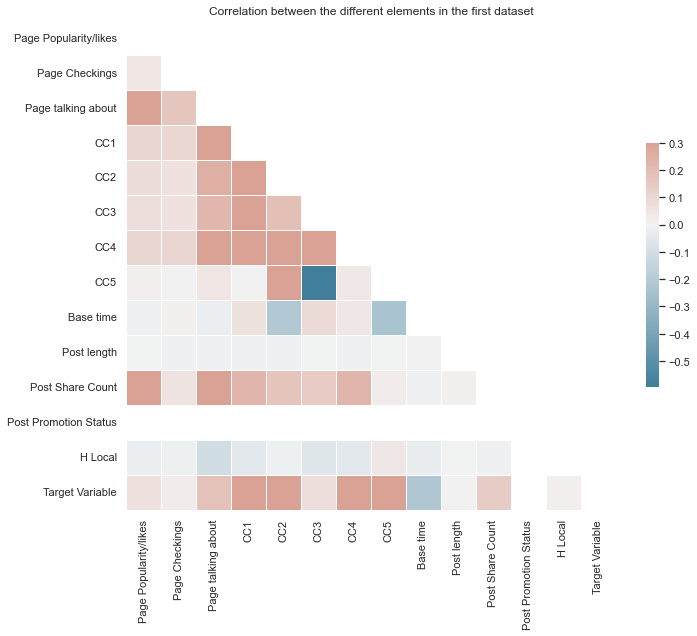

In [7]:
sns.set_theme(style="white")

# Compute the correlation matrix
corr = datafb1_resume.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
ax.title.set_text("Correlation between the different elements in the first dataset")

**Interpretation :** 


We can observe that, for instance, the target variable is highly correlated with CC1 *(The total number of comments before selected base date/time)*, CC2 *(The number of comments in last 48 to last 24 hours relative to base date/time)*, CC4 *(The number of comments in the first 24 hours after the publication of post but before base date/time)* and CC5 *(The difference between CC2 and CC3)* Which is purely logical.



Then the main features, positivly correlated with target variable are the post share count and the Page talking about, which defines the daily interest of individuals towards source of the document/ Post. The people who actually come back to the page, after liking the page. This include activities such as comments, likes to a post, shares, etc by visitors to the page.


2) Observe the number of comment depending of the hour number after the publication annd the category

In [29]:
data=datafb1_resume.groupby('Page Category').mean()
data.reset_index(inplace=True)
data.sort_values('Target Variable')
fig = px.bar(data[0:15], x="Page Category", y=["CC4", "CC2", "CC3"],title="Number of comments CC4, CC2, CC3 by category")
fig.show()

*You need to download the notebook and execute the cells to obtain this graph :*

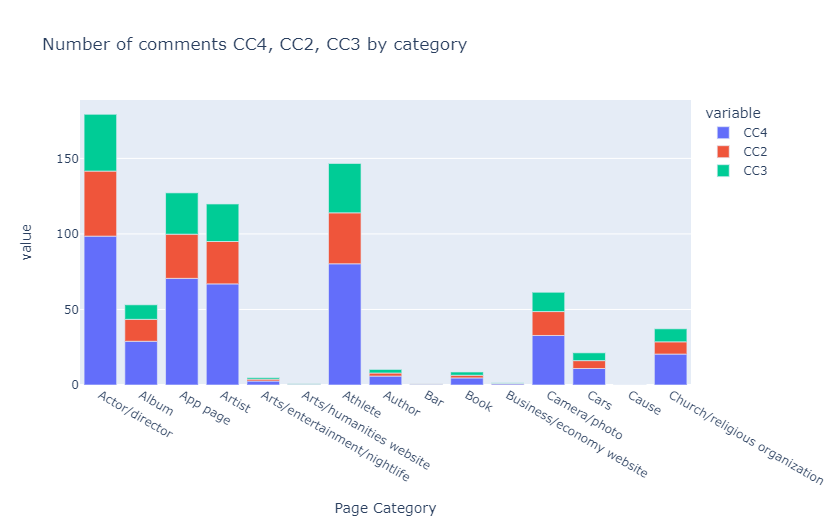

3) Page Popularity according to the weekday

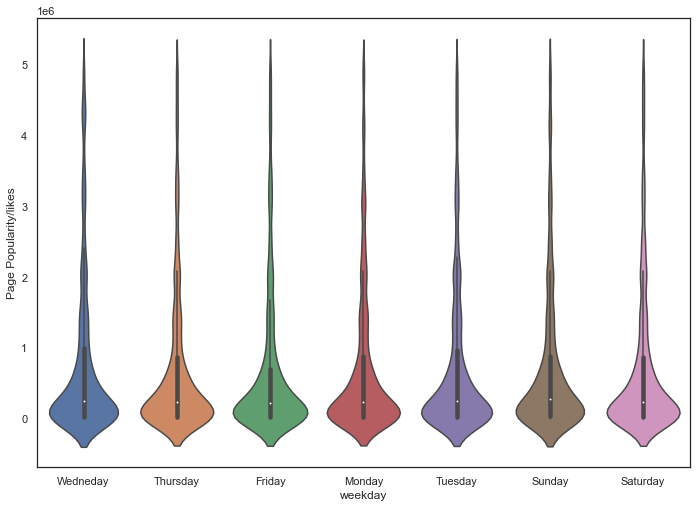

In [30]:
databoxplot=datafb1_resume[datafb1_resume["Page Popularity/likes"]<5000000]
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
ax = sns.violinplot(data=databoxplot, x="weekday", y="Page Popularity/likes", ax=ax)

*Interpretation :*


There is no significal difference between the day of the week and the page popularity

#### 2. Study of several feature's impact on target variable <a class="anchor" id="Focus_Studies"></a>

##### 2.1 : Focus Study on Page Category <a class="anchor" id="Page_Category"></a>

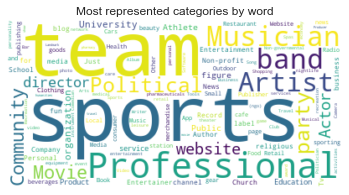

In [8]:
def countoccurrences(store, value):
    try:
        store[value] = store[value] + 1
    except KeyError as e:
        store[value] = 1
    return


text2_dict=""
for i in datafb1_resume['Page Category']:
    text2_dict+=i+' '
list = text2_dict.replace("/"," ").split(' ')

from collections import Counter
dict=Counter(list)

# create the WordCloud object
wordcloud = WordCloud(min_word_length =3, background_color='white')

# generate the word cloud
wordcloud.generate_from_frequencies(dict)

#plot
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Most represented categories by word")
plt.axis('off')
plt.show()

**Interpretation :** 

This is the word cloud of the most represented categories. sports, teams, and professionals are the words that appear most frequently


1) Focus on Page Category with the higher rate of comments *[in terms of sum of target variable]*

In [9]:
def plot_treemap(data,col,indication):
    fig = px.treemap(data, path=["Page Category"], values=col, height=700,
                 title="Most commented topics - in terms of "+indication, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()
    
plot_treemap(datafb1_resume,'Target Variable',"sum")

*You need to download the notebook and execute the cells to obtain this graph :*

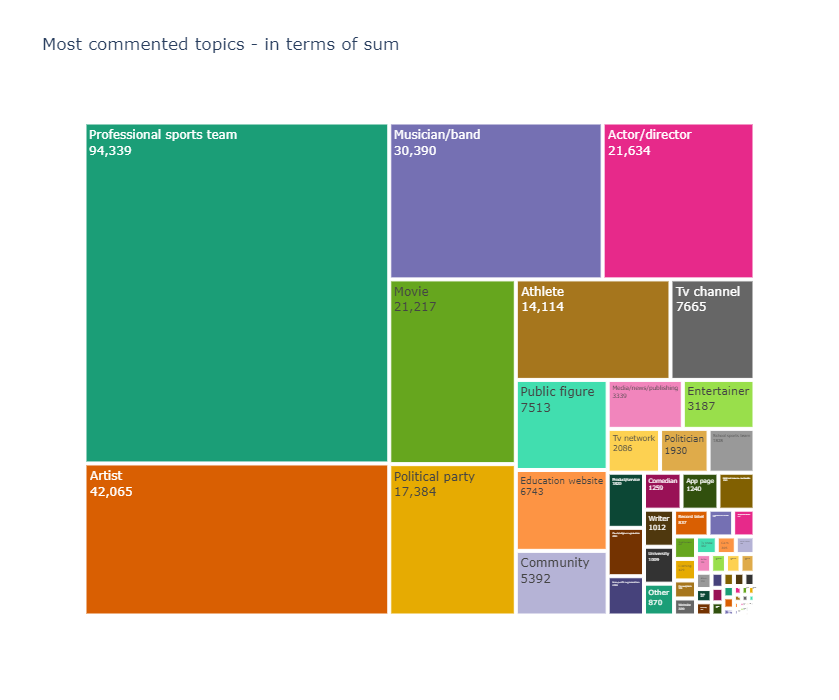


2) Focus on Page Category with the higher rate of comments **in general** *[in terms of mean of target variable]*

In [10]:
test=datafb1_resume.groupby('Page Category').mean()
test.reset_index(inplace=True)
plot_treemap(test,'Target Variable',"mean")

*You need to download the notebook and execute the cells to obtain this graph :*
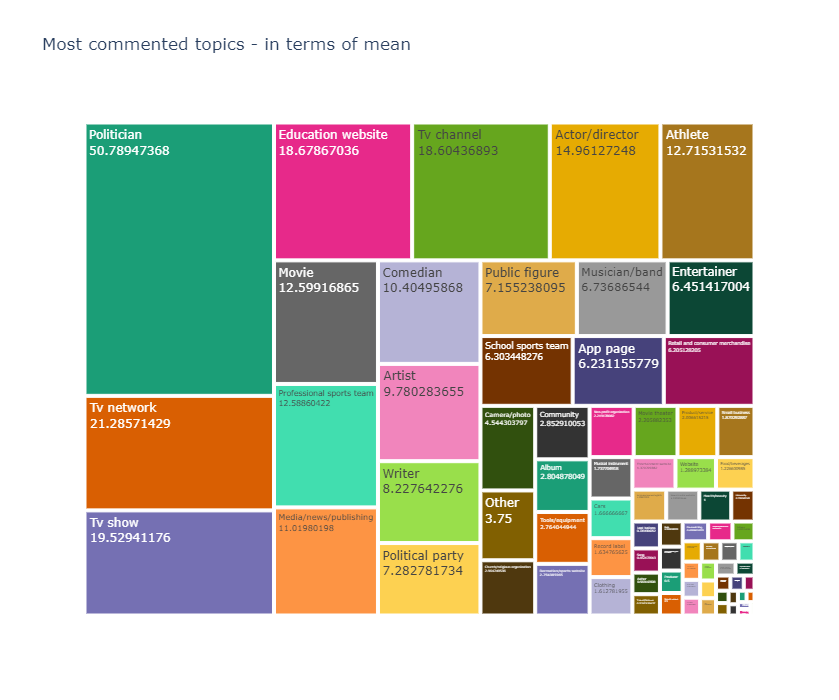

**Interpretation :** 

In terms of the sum of comments, the page category that reaches the first rank is the professional sports team with a total number of comments equal to 94,339. However, if we look in general and in terms of average on the data set, the ranking is different.

4) Radar of the top 3 Categories

In [ ]:
Top3=datafb1_resume[datafb1_resume['Page Category'].isin(['Politician','Tv network','Tv show'])]

radar_chart = pygal.Radar()
radar_chart.title = "Main caracteristics Top 3 Categories' Pages (in terms of average)"
radar_chart.x_labels = ['CC1',
       'CC2', 'CC3', 'CC4', 'CC5', 'Base time', 'Post length',
       'Post Share Count', 'Post Promotion Status', 'H Local',
       'Target Variable']
radar_chart.add('Politician',Top3[Top3['Page Category']=='Politician'].mean().values[3:])
radar_chart.add('Tv network', Top3[Top3['Page Category']=='Tv network'].mean().values[3:])
radar_chart.add('Tv show', Top3[Top3['Page Category']=='Tv show'].mean().values[3:])


*You need to download the notebook and execute the cells to obtain this graph :*

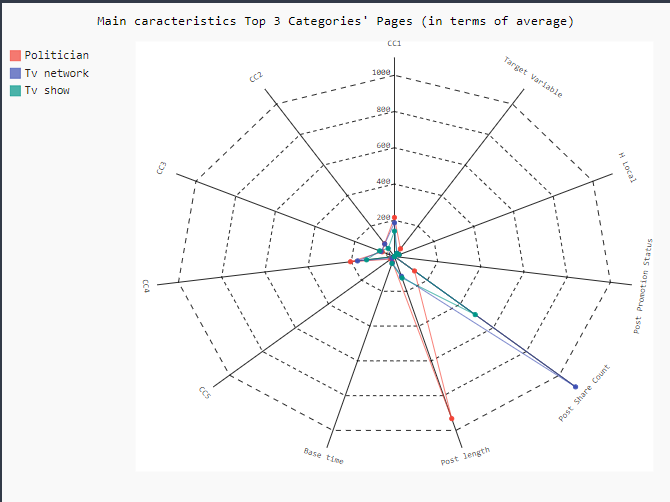


In [ ]:
Top3bis=datafb1_resume[datafb1_resume['Page Category'].isin(['Professional sports team','Artist','Musician/band'])]

radar_chart2 = pygal.Radar()
radar_chart2.title = "Main caracteristics Top 3 Categories' Pages (in terms of sum)"
radar_chart2.x_labels = ['CC1',
       'CC2', 'CC3', 'CC4', 'CC5', 'Base time', 'Post length',
       'Post Share Count', 'Post Promotion Status', 'H Local',
       'Target Variable']
radar_chart2.add('Professional sports team', Top3bis[Top3bis['Page Category']=='Professional sports team'].mean().values[3:])
radar_chart2.add('Artist', Top3bis[Top3bis['Page Category']=='Artist'].mean().values[3:])
radar_chart2.add('Musician/band', Top3bis[Top3bis['Page Category']=='Musician/band'].mean().values[3:])

*You need to download the notebook and execute the cells to obtain this graph :*

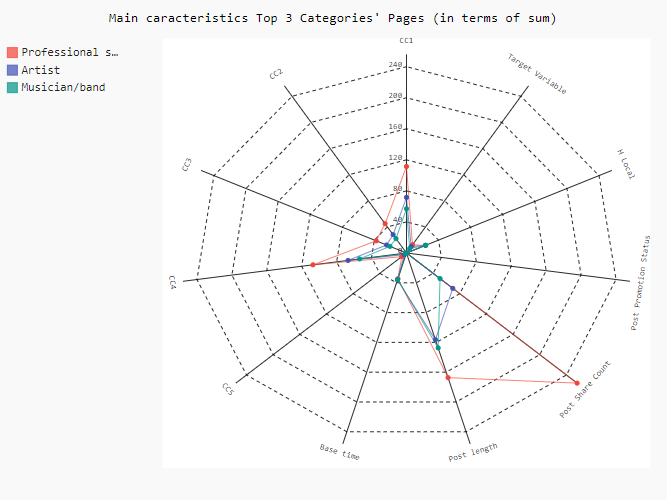

**Interpretation :** 


Here we can observe the combination and distribution of the different components that make up the pages of the top 3 page categories (in terms of sum or average) as studied above.

##### 2.1 : Weekday impact <a class="anchor" id="Weekday"></a>

1) Visualize the repartition of page checkings according to the weekday

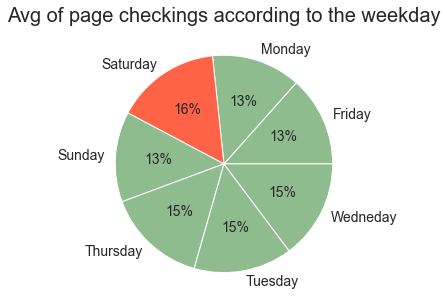

In [123]:
plt.rcParams.update({'font.size': 10})

check_day=pd.DataFrame(datafb1_resume.groupby('weekday')['Page Checkings'].mean())
#create pie chart
clrs =['tomato' if x == max(check_day['Page Checkings'])else 'darkseagreen' for x in check_day['Page Checkings']]
fig = plt.figure(figsize=(5, 5))
plt.pie(check_day['Page Checkings'], labels= check_day.index, colors=clrs, autopct='%.f%%', textprops={'fontsize': 14})
plt.title("Avg of page checkings according to the weekday",fontsize=20)
plt.show()

plt.show()

**Interpretation :** 

Saturday seems to be the day when most of the consumers use Facebook and visited pages. The average number of pages checkings is around 16%, i.e. 1 to 3% higher than for the other daysThe average of page chechings is around 16%. 


2) Visualization of the average number of comments according to weekday

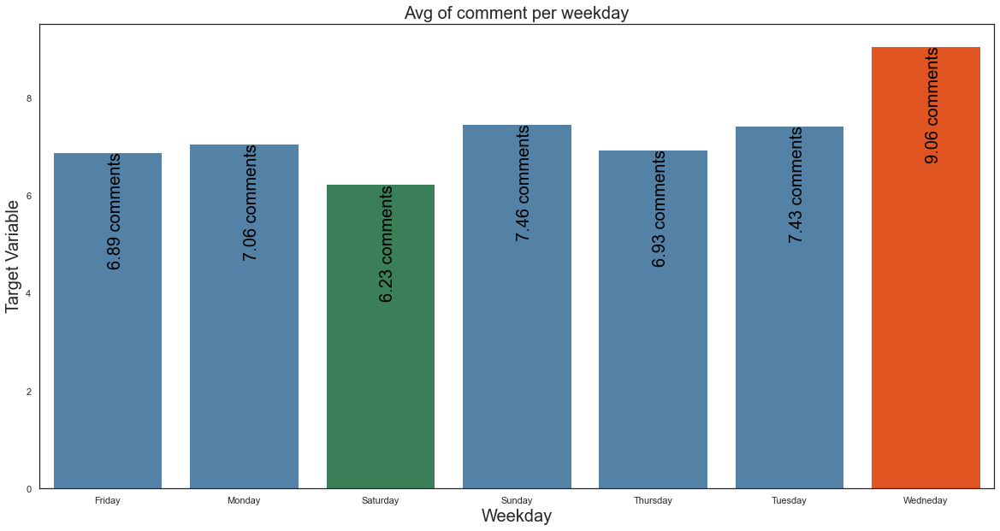

In [182]:
import matplotlib.pyplot as plt
import seaborn as sns
 
fig, ax =plt.subplots(figsize=(20,10))
color=['cadetblue','Greens_d']
clrs = ['steelblue' if (x < max(comment_day['Target Variable'])) else 'orangered' for x in comment_day['Target Variable'] ]
clrs2 = ['steelblue' if (x > min (comment_day['Target Variable'])) else 'seagreen' for x in comment_day['Target Variable'] ]
clrs[clrs2.index('seagreen')]="seagreen"


plt=sns.barplot(x=comment_day.index, y=comment_day['Target Variable'], data=comment_day, palette=clrs)

plt.set_title('Avg of comment per weekday',fontsize=20)
ax.set_xlabel('Weekday',fontsize=20)
ax.set_ylabel('Target Variable',fontsize=20)



for i, v in enumerate(comment_day['Target Variable'].iteritems()):        
    ax.text(i ,v[1], "{:.2f} comments".format(v[1]), color='black', va ='top', 
    rotation=90,fontsize=20)


**Interpretation :** 

This graph shows that, on average, the best day to post should be Wednesday, as it appears that the customer activity of posting reviews is higher than on other days.
The minimum number of comments posted concerns Saturday with an average of 6.23 comments per post.

3) Visualization of the top "page talking about" depending on week day and category

In [13]:
df2=pd.DataFrame(datafb1_resume.groupby(['Page Category','weekday'])['Page talking about'].mean())

df2.sort_values('Page talking about',ascending=False)
df2.reset_index(inplace=True)
df2
fig = px.sunburst(df2[0:40], path=['weekday',"Page Category"], values='Page talking about',title="Main 'page talking about' depending on the day and the category")

fig.show()

*You need to download the notebook and execute the cells to obtain this graph :*

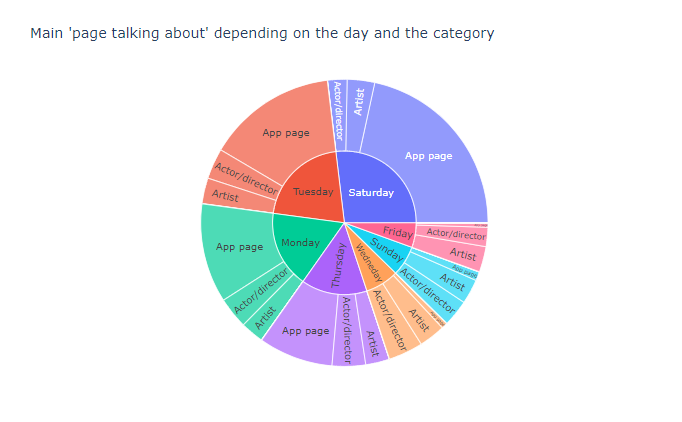

4) Impact of the Weekday on the number of share post

Text(0, 0.5, 'Page talking about')

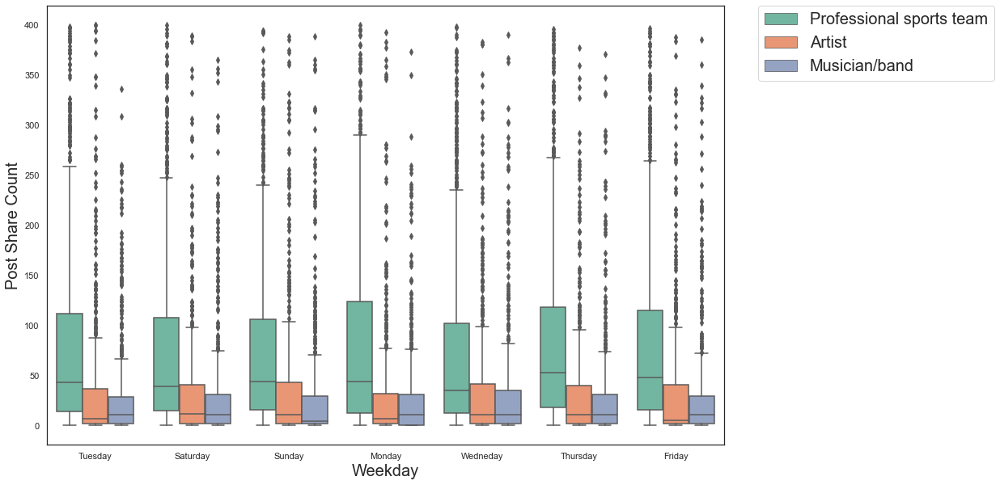

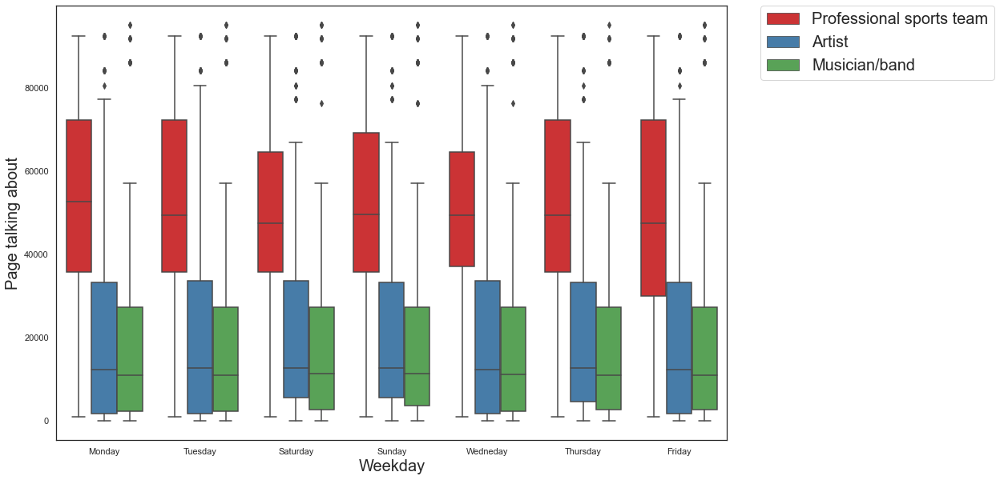

In [43]:
Top3=datafb1_resume[datafb1_resume['Page Category'].isin(['Professional sports team','Artist','Musician/band'])]
Top3bis=datafb1_resume[datafb1_resume["Page Category"].isin(['Professional sports team','Artist','Musician/band'])]
col=['Light reddish violet','stealblue','green']

f, ax = plt.subplots(figsize=(15, 10))
sns.boxplot(x='weekday', y='Post Share Count',hue="Page Category",data=Top3[Top3["Post Share Count"]<400], palette="Set2")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=20)
ax.set_xlabel("Weekday", fontsize=20)
ax.set_ylabel("Post Share Count", fontsize=20)

f, ax = plt.subplots(figsize=(15, 10))
sns.boxplot(x='weekday', y='Page talking about',hue="Page Category",data=Top3bis[Top3bis['Page talking about']<100000], palette="Set1")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=20)
ax.set_xlabel("Weekday", fontsize=20)
ax.set_ylabel("Page talking about", fontsize=20)

**Interpretation :** 

On the first graph we understand that in average, the Professional sport team Page category have higher number of share count. This could explain why it is the first category page on ranking of target variable.


Regarding the second graph, we also see that the statistics of "Page talking about " for the Professional sports team page category (i.e. the 1st quartile, median, 3rd quartile) are really higher than the two other categories pages described on the graph. This also enforces the hypothesis made with the first graph.

5) Influence of the weekday on the number of post sharing and the number of post's comments According to the category page

In [15]:
datafb1scatt=datafb1_resume[datafb1_resume["Target Variable"]!=0]

px.scatter(datafb1scatt, x="Target Variable", y="Post Share Count", animation_frame="Page Category", animation_group="weekday",
           size="Post Share Count", color="weekday", hover_name="weekday",
           size_max=1000,range_y=[0,400],range_x=[0,1000],opacity=1)

*You need to download the notebook and execute the cells to obtain this graph :*
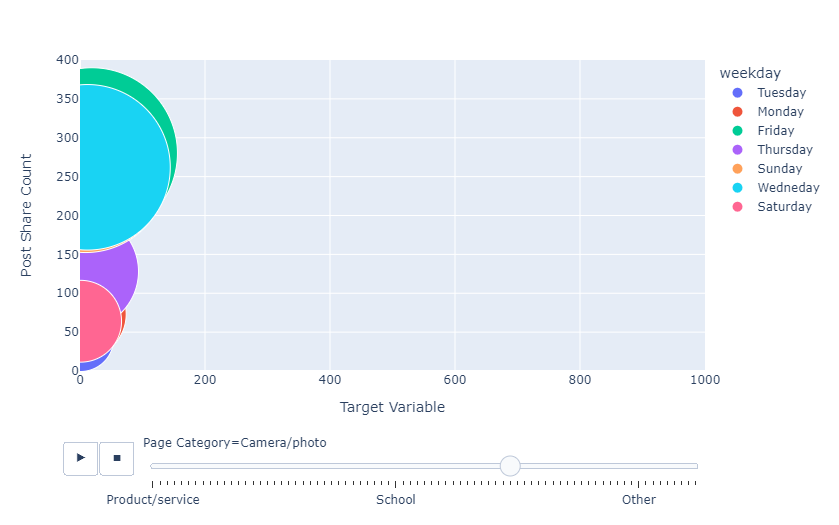


##### 2.3 : Influence of Length <a class="anchor" id="Length"></a>

1) Correlation between the length of a post and its number of comment

In [16]:
datafb_popularity=datafb1_resume.groupby('Post length')["Target Variable"].mean().reset_index(level=None, drop=False,inplace=False)
px.line(datafb_popularity,x='Post length',y='Target Variable', title ="Correlation between the length of a post and its number of comment")

*You need to download the notebook and execute the cells to obtain this graph :*
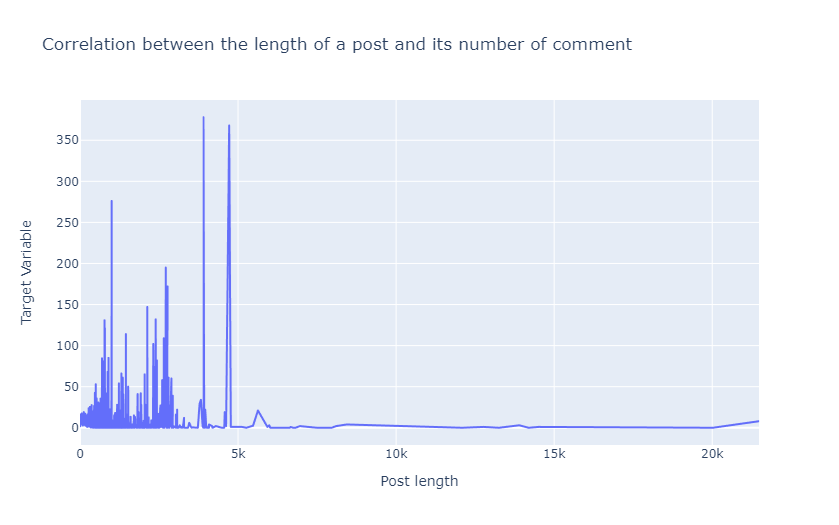


**Interpretation :** 

We observe that the post's length that generates the higher number of comments resids in a plage between 1000 and 4800 characters.
This may indicate that the shorter the post is and the higher the number of lectors would react to it.

A long post is less susceptible to being "popular" in terms of the number of comments. this is certainly due to the fact that lectors do not have time to read and react to these types of posts.

2.1) Impact of the length and the share count on target variable

In [17]:
import plotly.express as px
datafb1scatt=datafb1_resume[datafb1_resume["Post Share Count"]<100000]
fig = px.scatter(datafb1scatt, x="Post length", y="Target Variable",
	          color="Post Share Count", size="Post Share Count",
                  log_x=True, size_max=60, title="Impact of the lenght and share count of a post on the Target variable")
fig.show()

*You need to download the notebook and execute the cells to obtain this graph :*
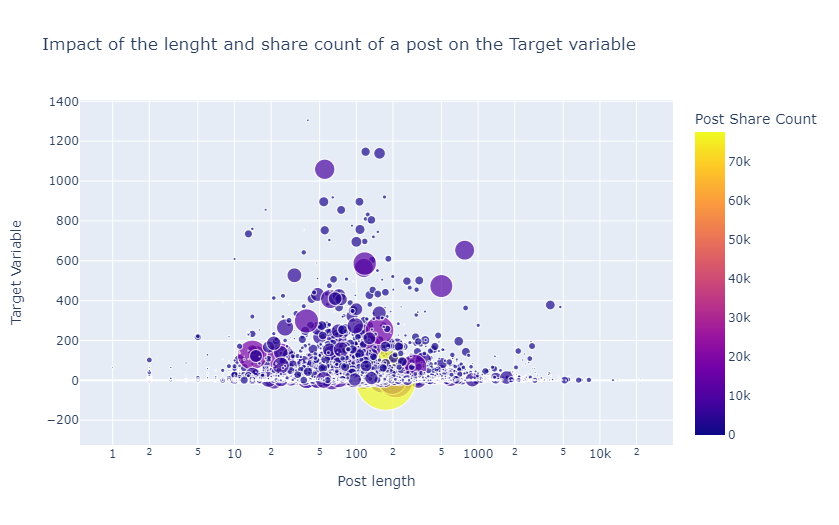

**Interpretation :** 

Regarding the graph above, we observe the impact of the length of a post and its distribution on Facebook (its number of shares) on the number of resulting comments.
As surprising as it may seem, we observe a large number of posts for which the number of shares is important but which does not present a significant number of comments in comparison.
One way to explain this could be the presence of posts for which comments could be disabled.

2.2) Impact of the length and the share count on target variable when removing row without target variable

In [18]:
import plotly.express as px
datafb1scatt=datafb1_resume[datafb1_resume["Post Share Count"]<100000]
datafb1scatt=datafb1scatt[datafb1scatt["Target Variable"]!=0]
fig = px.scatter(datafb1scatt, x="Post length", y="Target Variable",
	          color="Post Share Count", size="Post Share Count",
                  log_x=True, size_max=60, title="Impact of the lenght and share count of a post on the Target variable")
fig.show()

*You need to download the notebook and execute the cells to obtain this graph :*
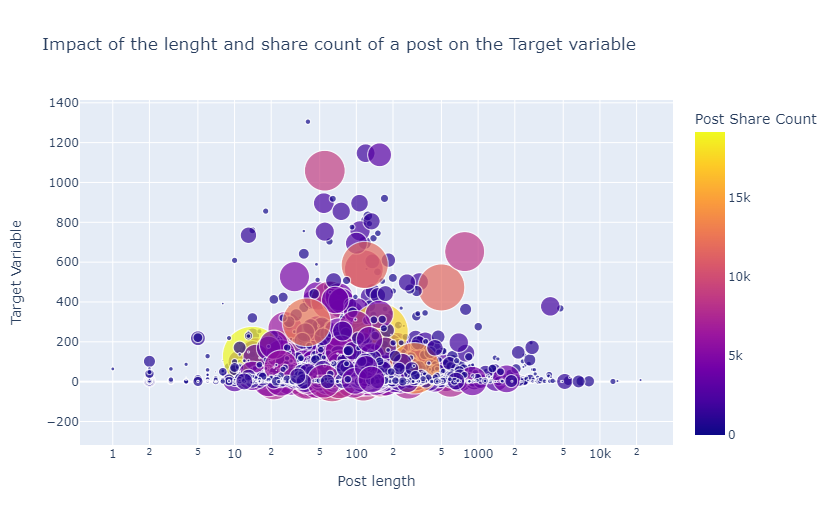

##### 2.4 : Other features' influences <a class="anchor" id="Other"></a>

2) Correlation between the page popularity and its number of comment

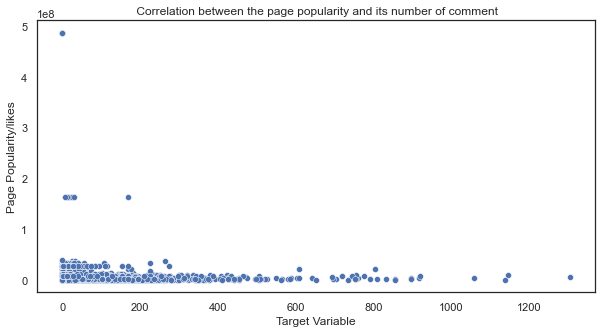

In [45]:
f, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(x=datafb1['Target Variable'],y=datafb1_resume['Page Popularity/likes'])
ax.title.set_text(" Correlation between the page popularity and its number of comment")

**Interpretation :** 

Surprisingly, The Page popularity of a page seems not to influence the number of comments under a post.

3) Correlation between post number of share and target variable

In [20]:
Top3=Top3[Top3["Target Variable"]!=0]
px.scatter(Top3, x="Target Variable", y="Post Share Count", animation_frame="weekday", animation_group="Page Category",
           size="Post length", color="Page Category", hover_name="Page Category",
           size_max=100,range_y=[0,400],range_x=[0,1300],opacity=1)


*You need to download the notebook and execute the cells to obtain the graph :*


In [21]:
data0=datafb1_resume[datafb1_resume["Target Variable"]==0]
data0=data0.groupby('Page Category').count()
data0.reset_index(inplace=True)
data0['Count']=data0["Post length"]

data0
fig = px.bar(data0, x="Page Category", y="Count",title="Count and catergory of null target Variable")
fig.show()

*You need to download the notebook and execute the cells to obtain this graph :*
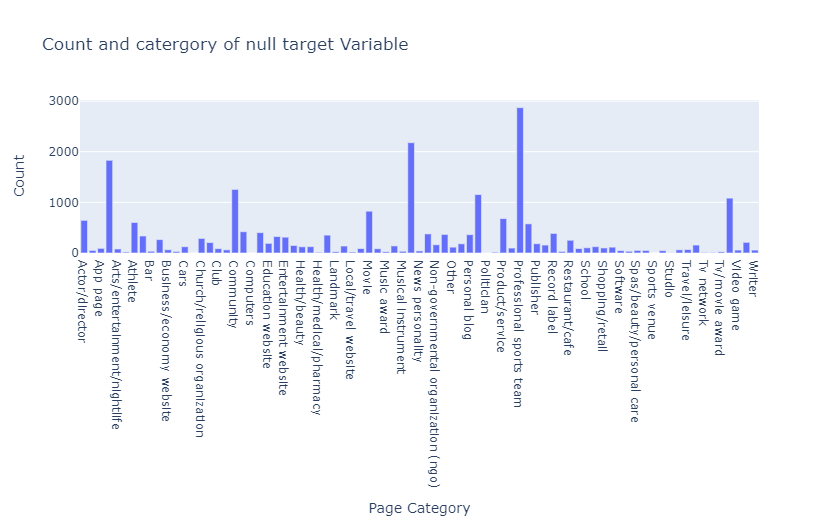

**Interpretation :** 

Weirdly, many page categories have a high number of posts with zero target variables

### Machine Learning <a class="anchor" id="Machine_learning"></a>

#### 1. Principal Component Analysis  <a class="anchor" id="PCA"></a>

##### Import Libraries <a class="anchor" id="Libraries2"></a>

In [22]:
# !pip install sklearn --upgrade
import sklearn
from sklearn.model_selection import train_test_split
print(sklearn.__version__) 

0.24.2


##### Data Preparation <a class="anchor" id="prepare2"></a>

In [24]:
X=datafb1[datafb1.columns.difference(['Target Variable','weekday'])]
y=datafb1["Target Variable"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
# We have 5 training datasets and 5 testing datasets but I'm doing everything on this one just for now
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(27435, 53)
(13514, 53)
(27435,)
(13514,)


##### PCA <a class="anchor" id="pca"></a>

1) Application to the data

In [71]:
from sklearn.decomposition import PCA

acp = PCA(svd_solver='full')
coord = acp.fit_transform(X_train)
print(acp.n_components_)
print(acp.explained_variance_ratio_) # 30% explained by the first component

53
[9.99829426e-01 1.61669461e-04 8.86816121e-06 1.78292950e-08
 1.19765941e-08 2.85864736e-09 1.15989620e-09 8.39722454e-10
 6.89569131e-10 2.81377099e-10 2.16238496e-10 4.42595488e-11
 2.88611407e-11 2.38041177e-11 2.12676561e-11 9.11543318e-12
 8.40142916e-12 7.87915841e-12 7.63627483e-12 7.39223946e-12
 3.55221345e-12 2.93159839e-12 1.44812099e-12 1.13699788e-12
 8.80307579e-13 4.90768061e-13 3.15786449e-13 2.20203722e-13
 1.31263890e-13 9.84877718e-14 8.75259836e-14 7.52471048e-14
 6.13797947e-14 3.30671670e-14 1.49022292e-14 8.69860564e-15
 5.21180886e-15 4.93073114e-15 3.49832562e-15 3.42835044e-15
 3.31323236e-15 3.19222858e-15 2.85724478e-15 2.80965104e-15
 2.67505253e-15 2.61736222e-15 1.01123449e-15 9.59153747e-16
 9.94266522e-33 9.94266522e-33 9.94266522e-33 9.94266522e-33
 8.05915511e-33]


2) Scree plot

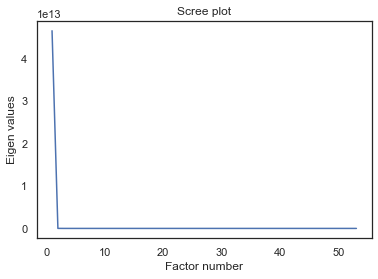

In [72]:
#number of observations
n = datafb1.shape[0]

#number of variables
p = datafb1.shape[1]
eigval = (n-1)/n*acp.explained_variance_

#scree plot
plt.plot(np.arange(1,p-1),eigval)
plt.title("Scree plot")
plt.ylabel("Eigen values")
plt.xlabel("Factor number")
plt.show()

**Interpretation :**

We can see that around the 23-26 first components, 95% of the variance is explained. We won't need the components after the 26th one but let's keep digging in order to know exactly when we reach 95%.

3) Cumsum of explained variance

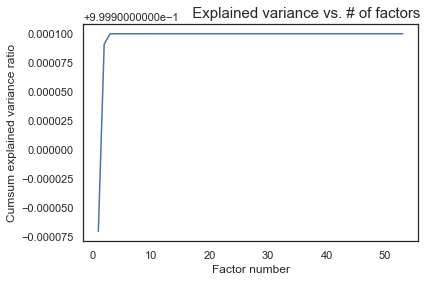

In [78]:
#cumsum of explained variance 
plt.plot(np.arange(1,p-1),np.cumsum(acp.explained_variance_ratio_))
plt.title("                  Explained variance vs. # of factors", fontsize=15)
plt.ylabel("Cumsum explained variance ratio")
plt.xlabel("Factor number")
plt.show()

In [79]:
print(np.cumsum(acp.explained_variance_ratio_))

[0.99982943 0.9999911  0.99999996 0.99999998 0.99999999 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.        ]


**Interpretation :** 


The PCA explains 95% of the variance with the 25 first components. That means that we can use the 25 first components without loosing a lot of information. It would also make the predictions faster because we use less data.

In [80]:
print(pd.DataFrame(acp.components_[0:25],columns=datafb1.columns[0:53]))
train_pca = acp.transform(X_train)
test_pca = acp.transform(X_test)

    Page Popularity/likes  Page Checkings  Page talking about  Page Category  \
0           -1.890845e-08        0.000002        8.443186e-07   6.580126e-07   
1           -7.335948e-06        0.000514        2.318455e-04   1.665466e-04   
2           -8.017615e-06       -0.000289       -6.983893e-05  -1.176745e-04   
3            2.531465e-04       -0.012109       -5.119253e-03  -3.721106e-03   
4           -3.234257e-07        0.066326        2.540080e-02   2.439938e-02   
5           -3.461789e-04       -0.006981       -2.454002e-03  -3.049606e-03   
6            1.807454e-03        0.061337        7.970177e-03   3.233303e-02   
7           -2.779255e-03       -0.356211       -1.351557e-01  -1.398053e-01   
8            3.242359e-03        0.490033        1.952819e-01   1.707424e-01   
9           -4.629367e-02       -0.079542        4.210524e-01  -3.865646e-01   
10           1.205578e-03       -0.280204       -1.751503e-01  -8.164405e-02   
11           1.486298e-02        0.02489

#### 2. Prediction  <a class="anchor" id="PCA"></a>

#####  Data Preparation  <a class="anchor" id="prepare3"></a>

In [81]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)                
X_train = scaler.transform(X_train)
X_test  = scaler.transform(X_test)

##### SVM  <a class="anchor" id="svm"></a>

In [26]:
from sklearn import svm
svr = svm.SVR(kernel='linear')

from sklearn.model_selection import  cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.model_selection import learning_curve

In [116]:
cross_val_score(svr, X_train, y_train)
#array([0.23037456, 0.25518354, 0.27412064, 0.24950104, 0.2338662 ]) ce n'est pas très bon

array([0.33605725, 0.31755901, 0.18663825, 0.1999838 , 0.25632128])

In [ ]:
parameters = {  'gamma' : [0.01, 0.1]           } # and 0.5
grid = GridSearchCV(svm.SVR(), parameters, n_jobs=-1, cv=5)
grid.fit(X_train, y_train)
print (grid.best_score_, grid.best_estimator_)
#0.15606157440610818 SVR(gamma=0.01)

In [ ]:
N,train_scores,val_scores=learning_curve(svm.SVR(),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train", title ="tets")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.set_til
plt.legend()

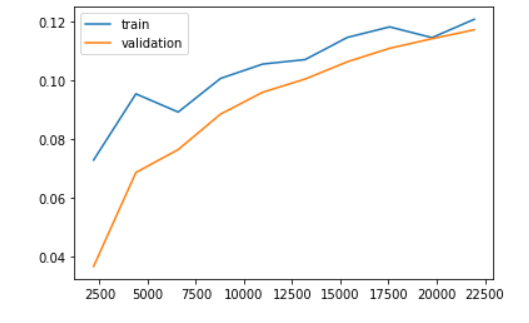

##### Lasso  <a class="anchor" id="lasso"></a>

In [84]:
from sklearn.linear_model import Lasso

In [ ]:
algo = Lasso()
params = {"max_iter" : [ 1000],
         "alpha" : [0.1], 
         "selection": ["random", "cyclic"]}
grid       = GridSearchCV(algo, params, n_jobs=-1)
grid.fit(X_train, y_train)
print (grid.best_score_, grid.best_estimator_)    
#0.23363314379533154 Lasso(alpha=0.1, selection='random')

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 5297.554337582784, tolerance: 332.3247345487694

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1623.852473219391, tolerance: 521.281727546138

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1528.4704678000417, tolerance: 314.02897994530554

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1034.8204392367043, tole

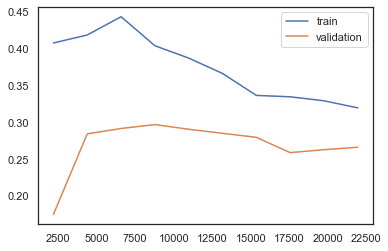

In [86]:
N,train_scores,val_scores=learning_curve(Lasso(alpha=0.1, selection='random'),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.legend()

In [ ]:
from sklearn.model_selection import GridSearchCV
def test_hyperparametres(algo, hyperparametres):
    grid       = GridSearchCV(algo, hyperparametres, n_jobs=-1)
    grid.fit(X_train, y_train)
    print (grid.best_score_, grid.best_estimator_)    
    return grid.best_score_, grid.best_estimator_

test_hyperparametres(Lasso(),{"max_iter" : [ 1000],
         "alpha" : [1.5,0.5,1,2], 
         "selection": ["random", "cyclic"]})
#0.29186614237615527 Lasso(alpha=1.5, selection='random')

##### Ridge  <a class="anchor" id="ridge"></a>

In [ ]:
from sklearn.linear_model import Ridge

test_hyperparametres(Ridge(),{"max_iter" : [3000, 1000],
         "alpha" : [0.5,1,2,100] })
# 0.22737442852720005 Ridge(alpha=100, max_iter=3000)
# (0.22737442852720005, Ridge(alpha=100, max_iter=3000))

In [ ]:
from sklearn.linear_model import RidgeCV

test_hyperparametres(RidgeCV(),{})
# 0.22156061038994976 RidgeCV(alphas=array([ 0.1,  1. , 10. ]))
# (0.22156061038994976, RidgeCV(alphas=array([ 0.1,  1. , 10. ])))

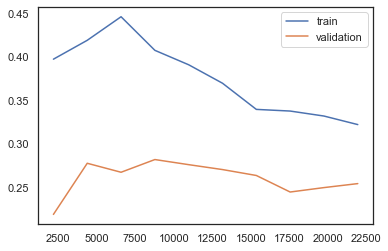

In [88]:
from sklearn.linear_model import Ridge

N,train_scores,val_scores=learning_curve(Ridge(alpha=100, max_iter=3000),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.legend()

##### ElasticNetCV  <a class="anchor" id="elasticNetCV"></a>

In [ ]:
from sklearn.linear_model import ElasticNetCV

test_hyperparametres(ElasticNetCV(),{"l1_ratio":[0.5,0.25,0.75],"n_alphas":[100,150]})
#0.3215338376167568 ElasticNetCV(l1_ratio=0.75)

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 347.2231424229685, tolerance: 279.6964748717949

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 464.3615406670142, tolerance: 279.6964748717949

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1172.3735212604515, tolerance: 449.4300079179723

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 2226.4851167434826, tole

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3187.828115563374, tolerance: 559.0163466869185

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 825.9654086632654, tolerance: 592.4521659832953

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1408.2651015729643, tolerance: 592.4521659832953

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1932.8713517547585, tole

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1822.8483565691859, tolerance: 1372.64327908869

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 2635.121203176677, tolerance: 1372.64327908869

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3487.666823754087, tolerance: 1831.531573199902

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3026.4676789827645, tolera

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 686.8698947899975, tolerance: 409.227404063034

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1241.5312220533378, tolerance: 409.227404063034

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1314.2517857560888, tolerance: 409.227404063034

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1523.5318165454082, tolera

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 565.5988690415397, tolerance: 451.6675955572432

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 685.7950049727224, tolerance: 656.6361521856754

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 943.8819899060763, tolerance: 656.6361521856754

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1257.6513894437812, toler

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1685.4882695432752, tolerance: 1564.850066631408

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 303.6692972916644, tolerance: 234.73900763532768

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 413.0724655010272, tolerance: 252.64398153846173

C:\Users\alixp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 633.9117336433847, tol

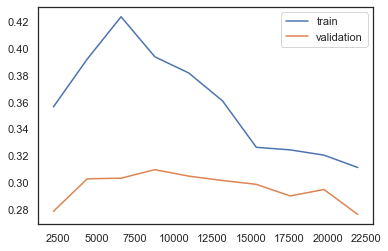

In [89]:
from sklearn.linear_model import ElasticNetCV

N,train_scores,val_scores=learning_curve(ElasticNetCV(l1_ratio=0.75),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.legend()

##### RandomForestRegressor  <a class="anchor" id="random_forest_regressor"></a>

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

algorf=RandomForestRegressor()
parametersrf={"max_depth" : [ 10],
         "random_state" : [0],"min_samples_split" : [6]}
gridrf       = GridSearchCV(algorf, parametersrf, n_jobs=-1)
gridrf.fit(train_pca, y_train)
print (gridrf.best_score_, gridrf.best_estimator_)   
# 0.3381610958414715 RandomForestRegressor(max_depth=10, min_samples_split=6, random_state=0)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import GridSearchCV

algorf=RandomForestRegressor()
parametersrf={"max_depth" : [15],
         "random_state" : [0],"min_samples_split" : [6]}
gridrf       = GridSearchCV(algorf, parametersrf, n_jobs=-1)
gridrf.fit(X_train, y_train)
print (gridrf.best_score_, gridrf.best_estimator_)   
#0.6059586096656977 RandomForestRegressor(max_depth=15, min_samples_split=6, random_state=0)

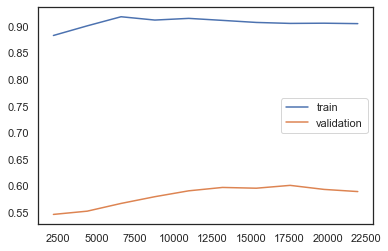

In [90]:
from sklearn.ensemble import RandomForestRegressor
N,train_scores,val_scores=learning_curve(RandomForestRegressor(max_depth=15, min_samples_split=6, random_state=0),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.legend()

##### GradientBoostingRegressor  <a class="anchor" id="gradient_boosting_regressor"></a>

In [103]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold


In [ ]:
from numpy import mean
from numpy import std

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# fit the model on the whole dataset
parametersboost={ "loss":["squared_error"], "learning_rate":[0.1,0.5], "n_estimators":[130], "subsample":[0.5,1.0]}
algoboost=GradientBoostingRegressor()
gridboost = GridSearchCV(algoboost, parametersboost, n_jobs=-1)
gridboost.fit(X_train, y_train)
print (gridboost.best_score_, gridboost.best_estimator_)  
gridboost.best_params_
#0.6180486041539913-> 0.6185435042843775-> 0.6196323958863511 GradientBoostingRegressor() {'learning_rate': 0.1,'loss': 'squared_error','n_estimators': 120,'subsample': 1.0}

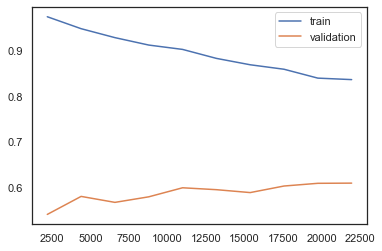

In [115]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import learning_curve
N,train_scores,val_scores=learning_curve(GradientBoostingRegressor(learning_rate= 0.1,n_estimators= 120,subsample= 1.0),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
plt.plot(N,train_scores.mean(axis=1),label="train")
plt.plot(N,val_scores.mean(axis=1),label="validation")
plt.legend()

In [ ]:
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import GridSearchCV

estimators = [('ridge', RidgeCV()),
              ('lasso', LassoCV(random_state=42)),
              ('knr', KNeighborsRegressor(n_neighbors=20,
                                          metric='euclidean'))]

final_estimator = GradientBoostingRegressor(n_estimators=25, subsample=0.5, min_samples_leaf=25, max_features=1, random_state=42)
reg = StackingRegressor(estimators=estimators,final_estimator=final_estimator)
reg.fit(X_train, y_train)
paramreg={}
gridreg = GridSearchCV(reg,paramreg, n_jobs=-1)
gridreg.fit(X_train, y_train)
print (gridreg.best_score_, gridreg.best_estimator_)  
# 0.33

##### VotingClassifier  <a class="anchor" id="voting_classifier"></a>

In [ ]:
from sklearn import datasets
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV

clf1 = LogisticRegression(random_state=1)
clf2 = RandomForestClassifier(random_state=1)
clf3 = GaussianNB()
eclf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('gnb', clf3)],
    voting='soft')

params = {'lr__C': [1.0, 10.0], 'rf__n_estimators': [20, 100]}

grid = GridSearchCV(estimator=eclf, param_grid=params, cv=5)
grid = grid.fit(X_train, y_train)  
print (grid.best_score_, grid.best_estimator_) 
#0.489119737561509 VotingClassifier(estimators=[('lr', LogisticRegression(random_state=1)),
#('rf',RandomForestClassifier(n_estimators=20,random_state=1)),('gnb', GaussianNB())],voting='soft') 

##### Graphics  <a class="anchor" id="graph"></a>

In [ ]:
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import svm
from sklearn.ensemble import GradientBoostingRegressor

Nsvm,train_scoressvm,val_scoressvm=learning_curve(svm.SVR(),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
NLasso,train_scoresLasso,val_scoresLasso=learning_curve(Lasso(alpha=0.1, selection='random'),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
Nelast,train_scoreselast,val_scoreselast=learning_curve(ElasticNetCV(l1_ratio=0.75),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
Nrfr,train_scoresrfr,val_scoresrfr=learning_curve(RandomForestRegressor(max_depth=15, min_samples_split=6, random_state=0),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)
Ngbr,train_scoresgbr,val_scoresgbr=learning_curve(GradientBoostingRegressor(learning_rate=0.1,loss="squared_error",n_estimators=120,subsample=1.0),X_train,y_train,train_sizes=np.linspace(0.1,1,10),cv=5)

In [ ]:
plt.plot(Nsvm,train_scoressvm.mean(axis=1),label="train_svm",color='b')
plt.plot(Nsvm,val_scoressvm.mean(axis=1),label="validation_svm",color="navy")
plt.plot(NLasso,train_scoresLasso.mean(axis=1),label="train_lasso",color="g")
plt.plot(NLasso,val_scoresLasso.mean(axis=1),label="validation_lasso",color="darkgreen")
plt.plot(Nelast,train_scoreselast.mean(axis=1),label="train_elasticnetcv",color="orange")
plt.plot(Nelast,val_scoreselast.mean(axis=1),label="validation_elasticnetcv",color="darkorange")
plt.plot(Nrfr,train_scoresrfr.mean(axis=1),label="train_randomForest",color="aqua")
plt.plot(Nrfr,val_scoresrfr.mean(axis=1),label="validation_randoForest",color="c")
plt.plot(Ngbr,train_scoresgbr.mean(axis=1),label="train_gradientBoosting",color="red")
plt.plot(Ngbr,val_scoresgbr.mean(axis=1),label="validation_gradientBoosting",color="crimson")
plt.legend(loc='upper right', bbox_to_anchor=(0.5, 0.5,1.2,0.5))

*You need to download the notebook and execute the cells to obtain this graph :*

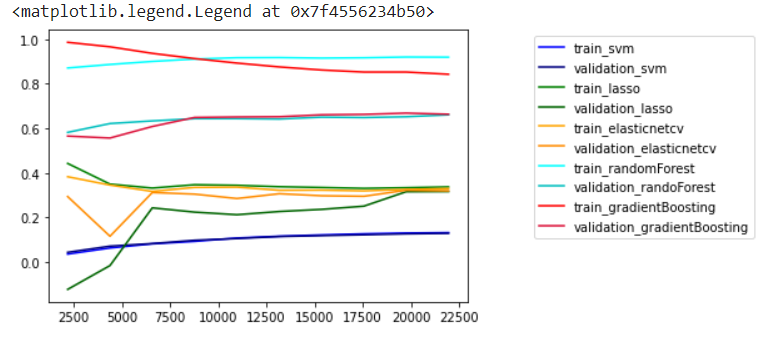

In [ ]:
import matplotlib.ticker as ticker
from sklearn.model_selection import validation_curve
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import svm
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RepeatedKFold

algos=[svm.SVR(),Lasso(),RidgeCV(),ElasticNetCV(),RandomForestRegressor(),GradientBoostingRegressor()]
params = [{  'gamma' : [ 0.01] },{"max_iter" : [500],"alpha" : [0.1], "selection": ["random"]},{"max_iter" : [1000],
         "alpha" : [0.5,2] },{"l1_ratio":[0.75]},{"max_depth" : [15],
         "random_state" : [0],"min_samples_split" : [6]},{"loss":["squared_error"], "learning_rate":[0.5], "n_estimators":[120], "subsample":[1.0]} ]

performances               = {}
classes_de_models_a_tester = algos
best_algorithm = 0
best_perf = 0

    
for k in range (0,len(algos)):
    try:
        algorithme = algos[k]
        #grid       = GridSearchCV(algorithme, params[k], n_jobs=-1)
        algorithme.fit(X_train, y_train)
        performance = algorithme.score(X_test, y_test)
        print (performance)
        if performance >  best_perf:
            best_algorithm = algorithme
            best_perf = performance
            
        if 0<performance and performance<1:
            performances[algorithme] = [performance]
    except Exception as e:
        if "label" in str(e): print ("Algo de classification")
        else                : print (str(e)[:50])
    #print ("="*30)
    
best_algorithm, best_perf

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

df = pd.DataFrame(performances).T

col_name = "performance"
df.columns = [col_name]

df.performance.sort_values()

liste_des_performances = df.performance.values
gains = [0]
for indice, performance in enumerate(liste_des_performances):
    if indice>0:
        previous_value = liste_des_performances[indice-1]
        current_value  = liste_des_performances[indice]
        gain = (current_value - previous_value) / previous_value
        gains.append(round(gain*100, 2))
df["gains"] = gains

df.reset_index(inplace=True)
df["index"][4]=RandomForestRegressor()
df["index"][5]=GradientBoostingRegressor()
df["index"][3]=RidgeCV()
df.set_index('index',inplace=True)

In [ ]:
#df = df.drop("gains", axis=1)
df = df.sort_values(col_name)
#ax = df.plot(rot=45, x_compat=True)


fig , axes = plt.subplots(1,1)
fig.set_size_inches(9,3)
df = df.sort_values(col_name )
axes.xaxis.set_ticklabels(df.index)
axes.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.title("Performance by model")
df.plot(rot=90, ax=axes)

*You need to download the notebook and execute the cells to obtain this graph :*

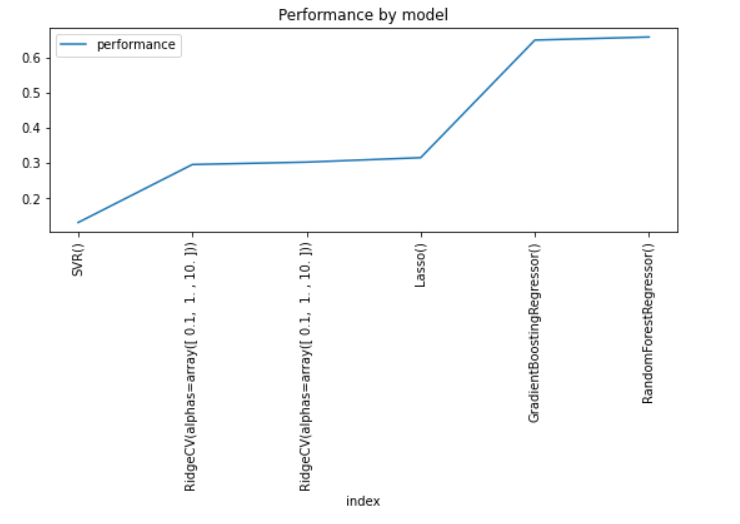

In [ ]:
fig , axes = plt.subplots(1,1)
fig.set_size_inches(9,3)
#df = df.sort_values(col_name )
axes.xaxis.set_ticklabels(df.index)
axes.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.title("Performance by model")
df.plot(kind='bar', rot=90, ax=axes)

*You need to download the notebook and execute the cells to obtain this graph :*

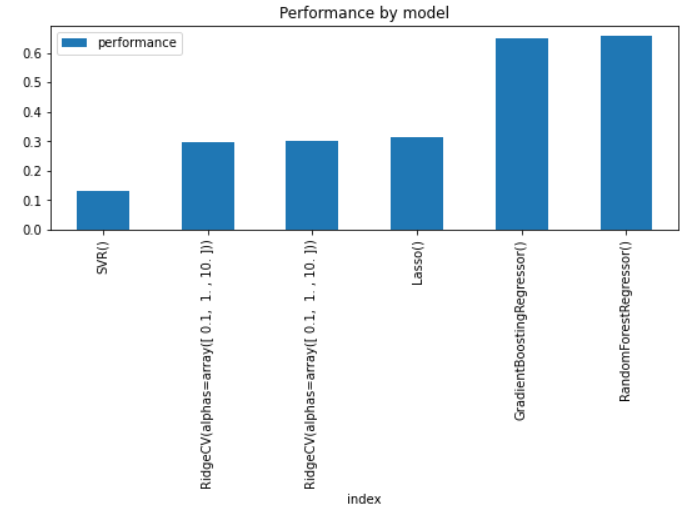